# Lockheed Martin Fighters

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai.vision import *

In [3]:
path = '/home/jtham_kyap1ws/data/lockheed_fighters'

In [4]:
path_valid = path + '/valid'
path_train = path + '/train'

In [5]:
doc(ImageDataBunch.from_folder)

from_folder [source] from_folder ( `path` : PathOrStr , `train` : PathOrStr = `'train'` , `valid` : PathOrStr = `'valid'` , `valid_pct` = `None` , `classes` : Collection [ T_co ]= `None` , `kwargs` : Any ) → ImageDataBunch 
 
 Create from imagenet style dataset in path with train , valid , test subfolders (or provide valid_pct ). 
 Show in docs

In [6]:
tfms = get_transforms(do_flip=True, flip_vert=True)

In [7]:
data = ImageDataBunch.from_folder(path, ds_tfms=tfms, size=500, bs=12)
data.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList
y: CategoryList (428 items)
[Category f-22, Category f-22, Category f-22, Category f-22, Category f-22]...
Path: /home/jtham_kyap1ws/data/lockheed_fighters
x: ImageItemList (428 items)
[Image (3, 1650, 2100), Image (3, 414, 621), Image (3, 356, 890), Image (3, 1632, 2528), Image (3, 715, 1072)]...
Path: /home/jtham_kyap1ws/data/lockheed_fighters;

Valid: LabelList
y: CategoryList (90 items)
[Category f-22, Category f-22, Category f-22, Category f-22, Category f-22]...
Path: /home/jtham_kyap1ws/data/lockheed_fighters
x: ImageItemList (90 items)
[Image (3, 985, 2000), Image (3, 2449, 3117), Image (3, 800, 1205), Image (3, 2832, 4248), Image (3, 828, 1280)]...
Path: /home/jtham_kyap1ws/data/lockheed_fighters;

Test: None

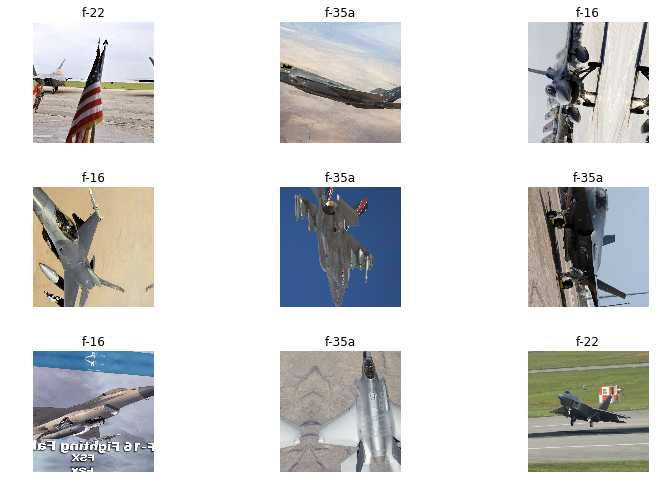

In [8]:
data.show_batch(rows=3, figsize=(11,7))

In [9]:
data.classes

['f-16', 'f-22', 'f-35a']

In [15]:
from torchvision.models import *


for c in data.classes :
    print(c)
    verify_images(path+'/'+c, delete=True, max_size=2000)

In [17]:

%time learn = create_cnn(data, models.densenet121, metrics=accuracy)

AttributeError: module 'fastai.vision.models' has no attribute 'densenet121'

In [ ]:
learn.load('stage-2')

In [13]:
learn.model = learn.model.cpu()
learn.export()

In [11]:
%time learn.fit_one_cycle(10)

epoch,train_loss,valid_loss,accuracy
1,0.959492,0.602735,0.788889
2,0.679200,0.540564,0.833333
3,0.580698,0.450579,0.811111
4,0.539595,0.536146,0.788889
5,0.495143,0.377444,0.844444
6,0.413967,0.427524,0.855556
7,0.368299,0.353301,0.888889
8,0.334259,0.351449,0.877778
9,0.314820,0.342555,0.888889
10,0.266959,0.342684,0.888889


CPU times: user 30.2 s, sys: 12.2 s, total: 42.4 s
Wall time: 7min 19s


In [ ]:
%time learn.fit_one_cycle(5)

In [16]:
learn.save('stage1')

In [ ]:
learn.load('stage-2')

In [15]:
learn.unfreeze();

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


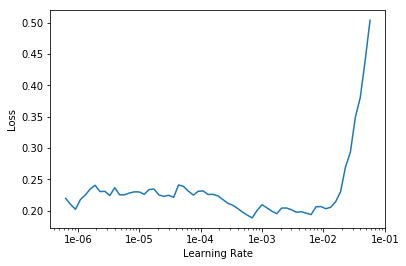

In [14]:
learn.lr_find(); learn.recorder.plot()

In [16]:
learn.fit_one_cycle(20, max_lr=slice(1e-5, 1e-2))

epoch,train_loss,valid_loss,accuracy
1,0.231560,0.237269,0.888889
2,0.226218,0.456465,0.811111
3,0.404719,0.443018,0.855556
4,0.531274,0.531785,0.855556
5,0.560907,6.467041,0.422222
6,0.560525,0.490329,0.800000
7,0.537081,0.287380,0.877778
8,0.487123,0.531584,0.777778
9,0.470999,0.847882,0.677778


Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/opt/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/opt/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/opt/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/opt/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/opt/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
Traceback (most recent call last):
  

KeyboardInterrupt: 

In [21]:
learn.save('stage-2')

In [ ]:
learn.load('stage-2')

In [48]:
import torch
torch.cuda.empty_cache()

In [ ]:
learn.fit_one_cycle(10, max_lr=slice(1e-5, 1e-4))

### Interpret Results

In [ ]:
learn.load('stage-2')

In [23]:
interp = ClassificationInterpretation.from_learner(learn)

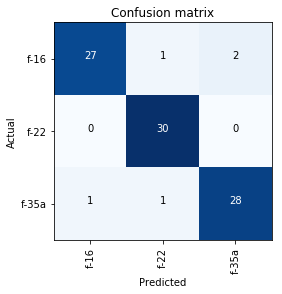

In [24]:
interp.plot_confusion_matrix()

### Try different things with sz, bs and model

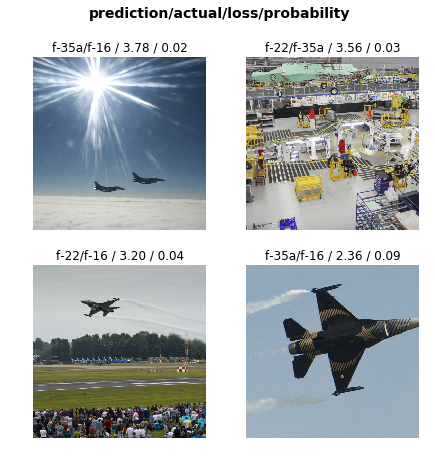

In [25]:
interp.plot_top_losses(4, figsize=(7,7))

In [26]:
learn.export()

In [44]:
defaults.device = torch.device('cuda')

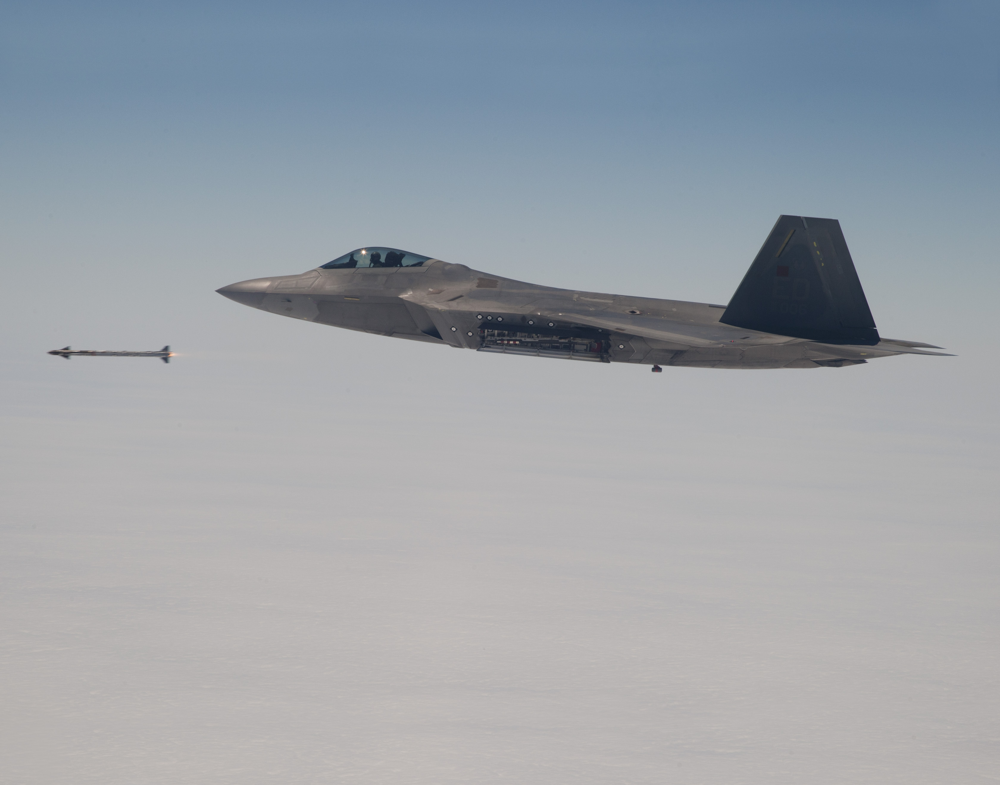

In [37]:
img = open_image(path + '/valid/f-22/f-22(222).jpg')
img

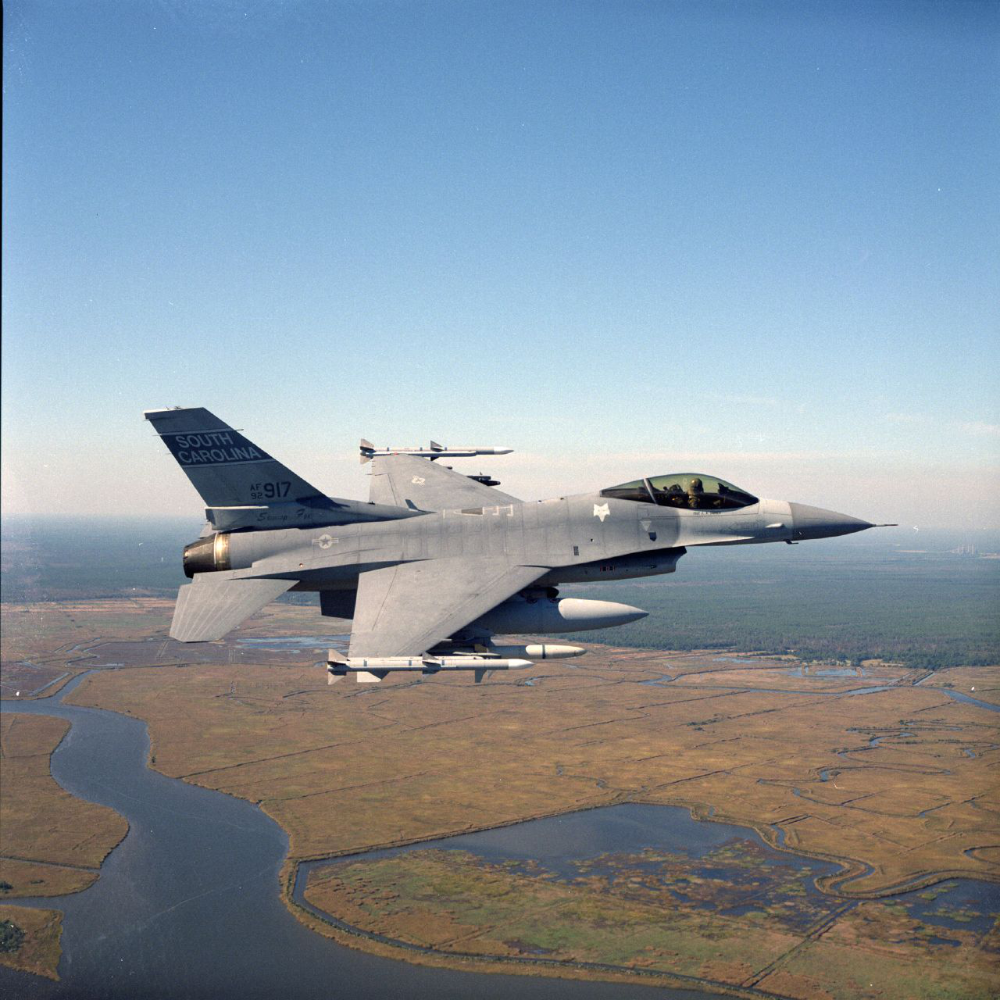

In [39]:
img = open_image(path + '/valid/f-16/96_29476_1115741330_o.jpg')
img

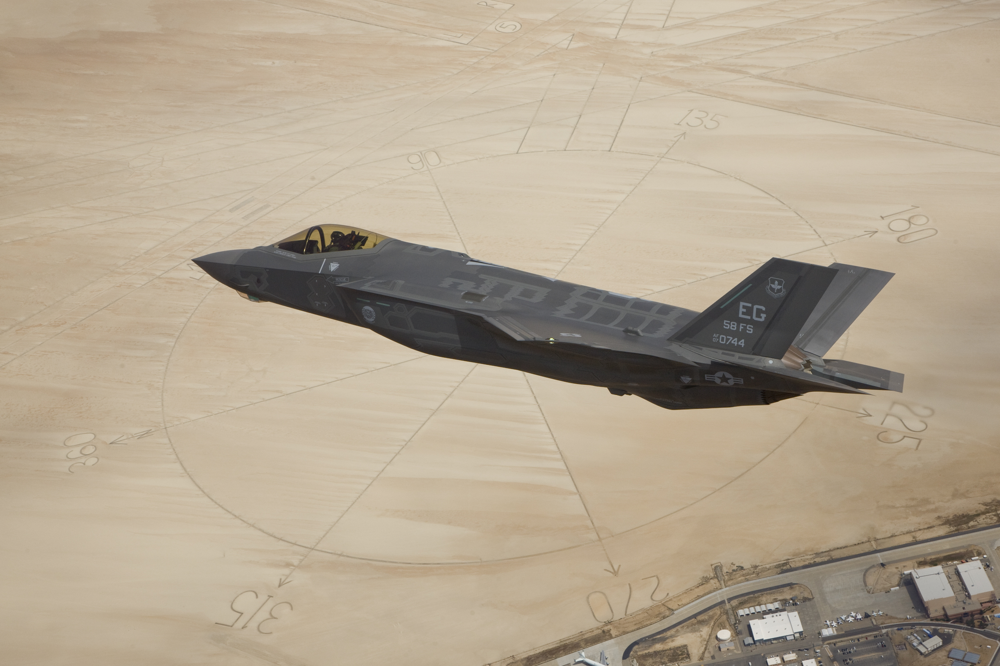

In [41]:
img = open_image(path + '/valid/f-35a/second-f-35a-production-jet-arrives-at-edwards-afb_5730917976_o.jpg')
img

In [29]:
newPath = Path(path)
learn = load_learner(newPath)

In [42]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category f-35a